

---


**SCALING**

---



In [4]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


[[0.  0. ]
 [2.  0. ]
 [2.  1.5]
 [0.  1.5]
 [0.  0. ]]


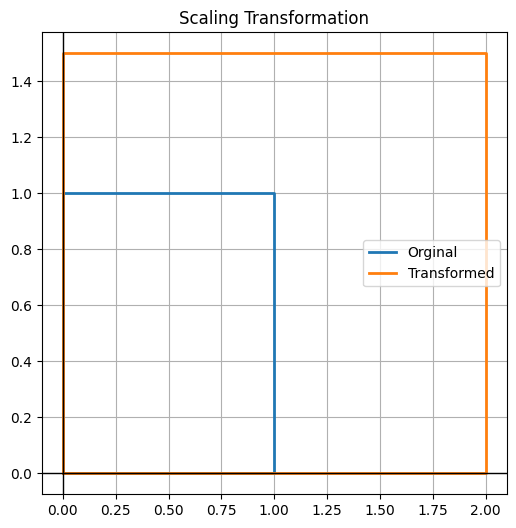

In [5]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import cv2
points=np.array([
    [0,0],
    [1,0],
    [1,1],
    [0,1],
    [0,0]
])

S=np.array([[2,0],[0,1.5]])  #Scaling matrix

def transform(points,matrix):
  return(matrix @ points.T).T

scaled=transform(points,S)
print(scaled)

def plot_transform(original,transformed,title):
  plt.figure(figsize=(6,6))
  plt.plot(original[:,0],original[:,1],label="Orginal",linewidth=2)
  plt.plot(transformed[:,0],transformed[:,1],label="Transformed",linewidth=2)
  plt.axhline(0,color="black",linewidth=1)
  plt.axvline(0,color="black",linewidth=1)
  plt.legend()
  plt.title(title)
  plt.grid()
  plt.show()

plot_transform(points,scaled,"Scaling Transformation")

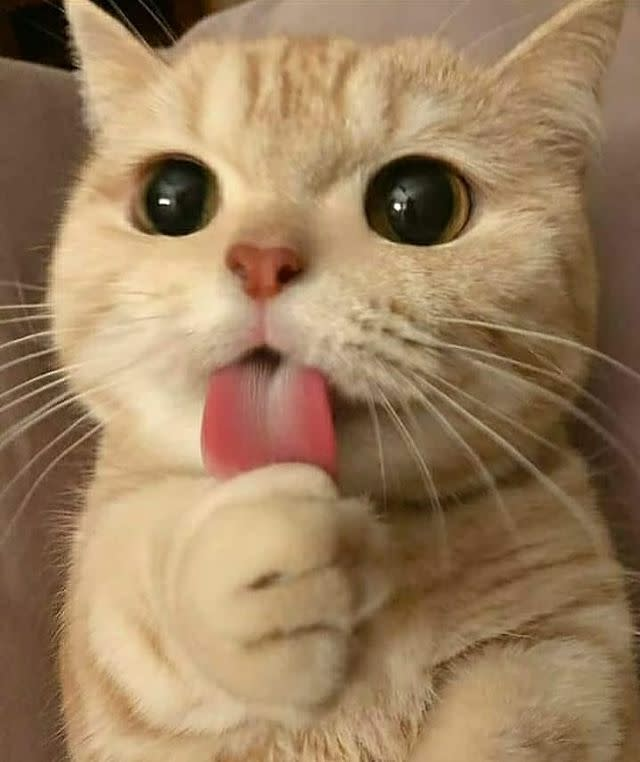

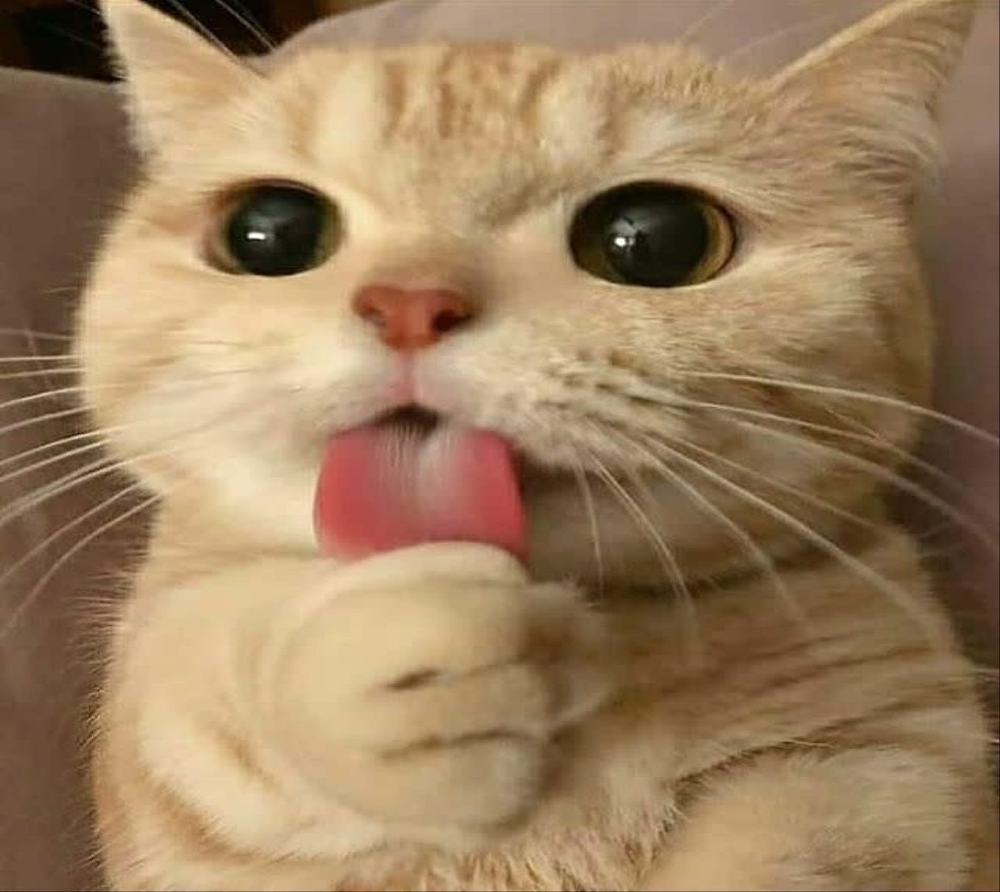

In [6]:
from google.colab.patches import cv2_imshow

image=cv2.imread('/content/drive/MyDrive/Google Colab/Deep Learning/CNN/cat.jpg')
S=np.array([[2,0],[0,1.5]])
height,width=image.shape[:2]
scaled_image=cv2.warpAffine(image,
                            np.vstack([S,[0,0]]).T[:2],
                            (int(width*2),int(height*1.5)))
cv2_imshow(image)
cv2_imshow(scaled_image)



---


**ROTATION**

---



[[0 0]
 [1 0]
 [1 1]
 [0 1]
 [0 0]]


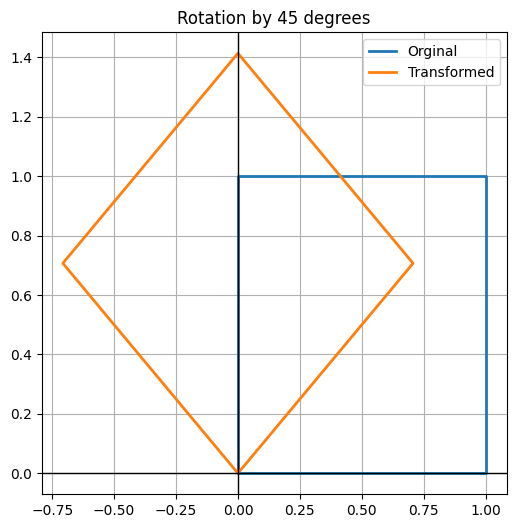

In [7]:
print(points)
theta=np.pi/4    #here theta is stored in radian value you can check after changing into degrees
R=np.array([[np.cos(theta),-np.sin(theta)],[np.sin(theta),np.cos(theta)]])
rotated=transform(points,R)

plot_transform(points,rotated,"Rotation by 45 degrees")

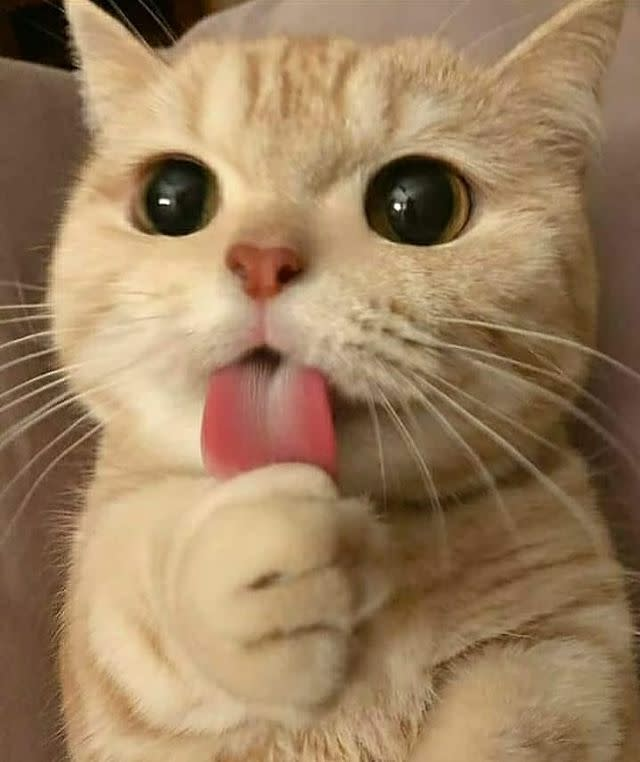

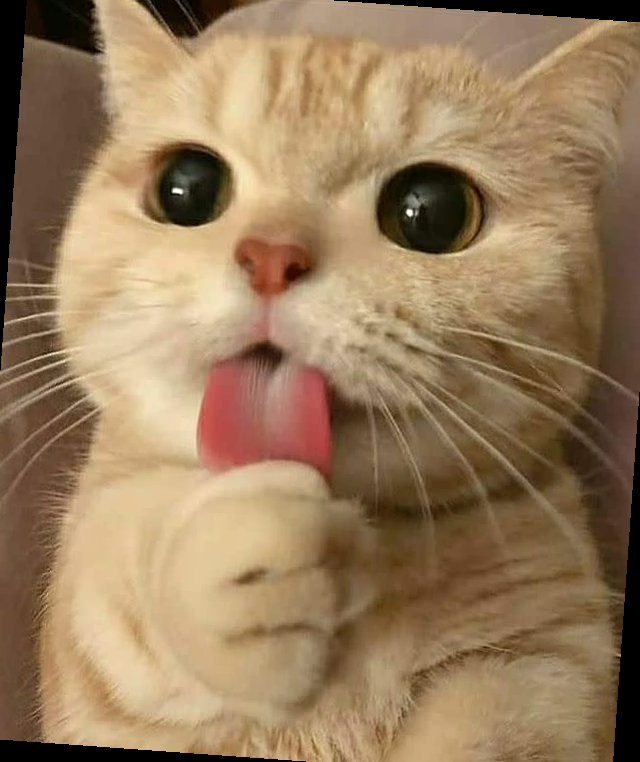

In [8]:
import random
from scipy.ndimage import rotate
from google.colab.patches import cv2_imshow
def rotate_image(image,angle_range=(-15,15)):
  """Rotate By Random Angle"""
  angle=random.uniform(angle_range[0],angle_range[1])
  rotated=rotate(image,angle,reshape=False,cval=0)
  return rotated.astype(np.uint8)
image=cv2.imread('/content/drive/MyDrive/Google Colab/Deep Learning/CNN/cat.jpg')
rotated_img=rotate_image(image)
cv2_imshow(image)
cv2_imshow(rotated_img)



---


**TRANSLATION**


---




[[0 0]
 [1 0]
 [1 1]
 [0 1]
 [0 0]]


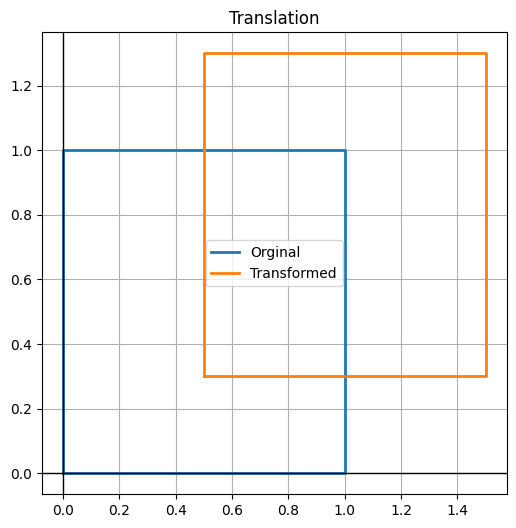

In [9]:
print(points)
tx,ty=0.5,0.3   #translation offsets

def translate(points,tx,ty):
  return points+np.array([tx,ty])

translated=translate(points,tx,ty)
plot_transform(points,translated,"Translation")


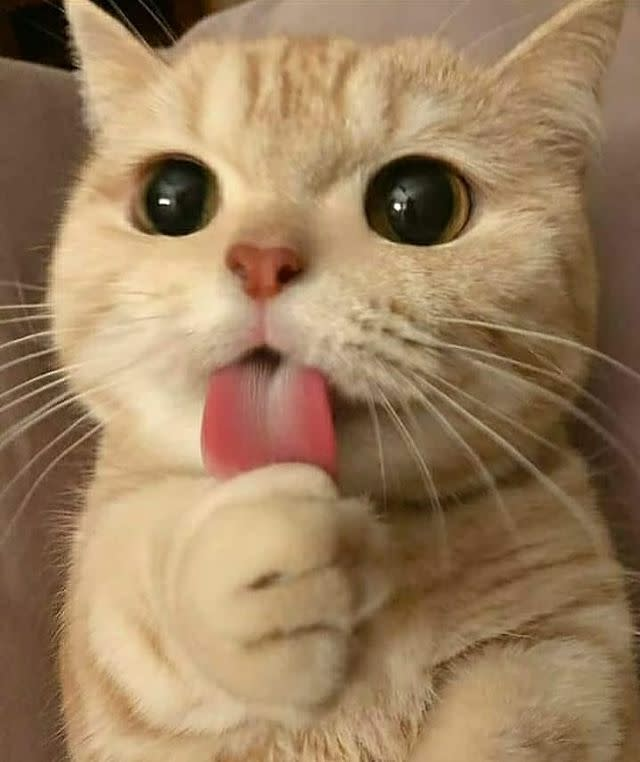

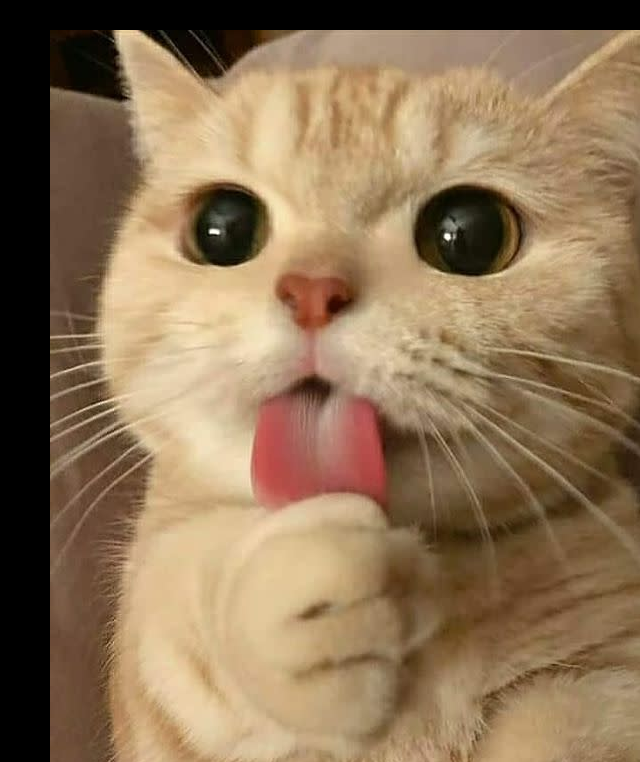

In [10]:
image=cv2.imread('/content/drive/MyDrive/Google Colab/Deep Learning/CNN/cat.jpg')
height,width=image.shape[:2]
tx,ty=50,30   #shift in pixels
T=np.float32([[1,0,tx],[0,1,ty]])
translated_image=cv2.warpAffine(image,T,(width,height))
cv2_imshow(image)
cv2_imshow(translated_image)




---


**FLIPPING**


---




[[0 0]
 [1 0]
 [1 1]
 [0 1]
 [0 0]]


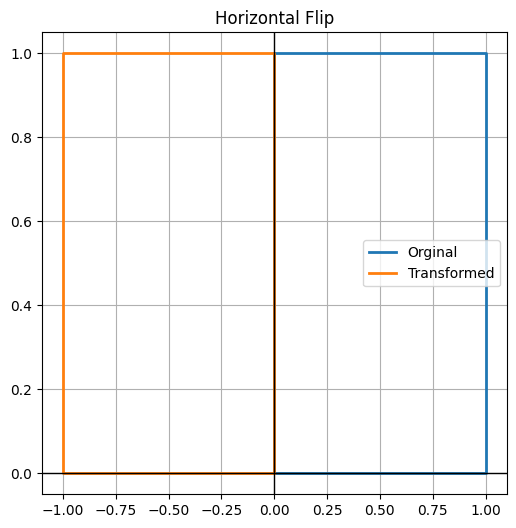

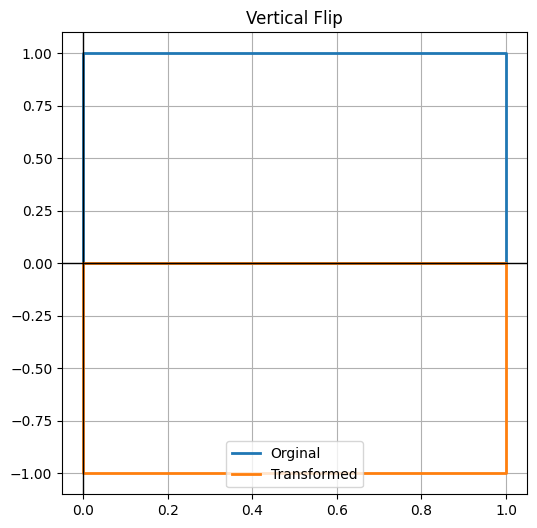

In [11]:
print(points)
Fh=np.array([[-1,0],[0,1]])   #Horizontal flip matrix
Fv=np.array([[1,0],[0,-1]])   #Vertical flip matrix

flipped_h=transform(points,Fh)
flipped_v=transform(points,Fv)

plot_transform(points,flipped_h,"Horizontal Flip")
plot_transform(points,flipped_v,"Vertical Flip")


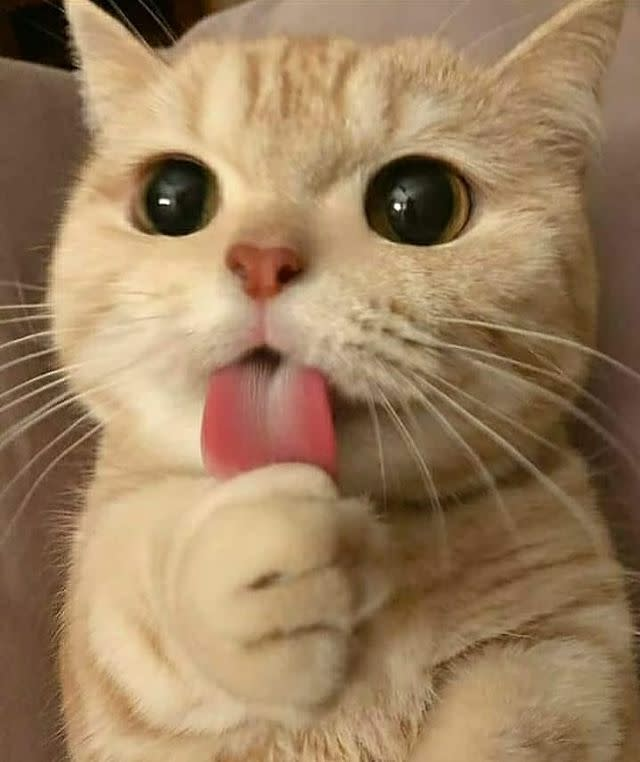

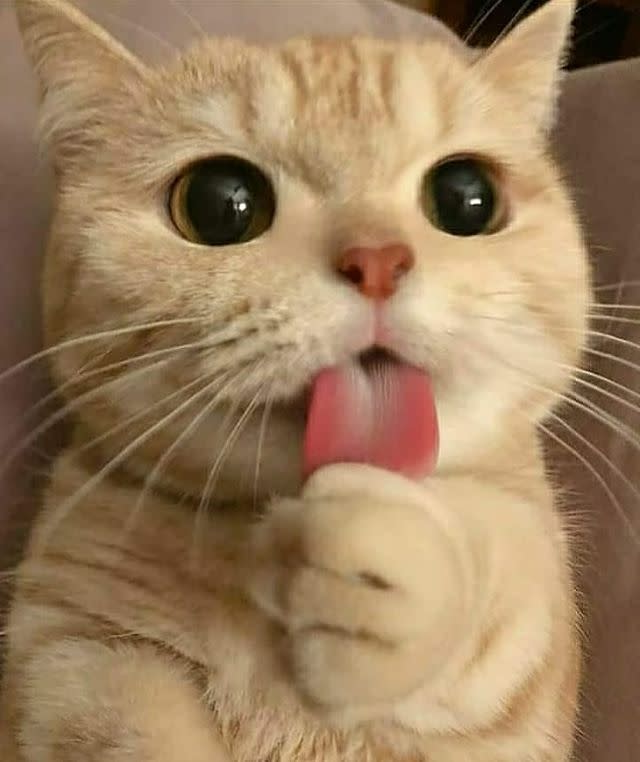

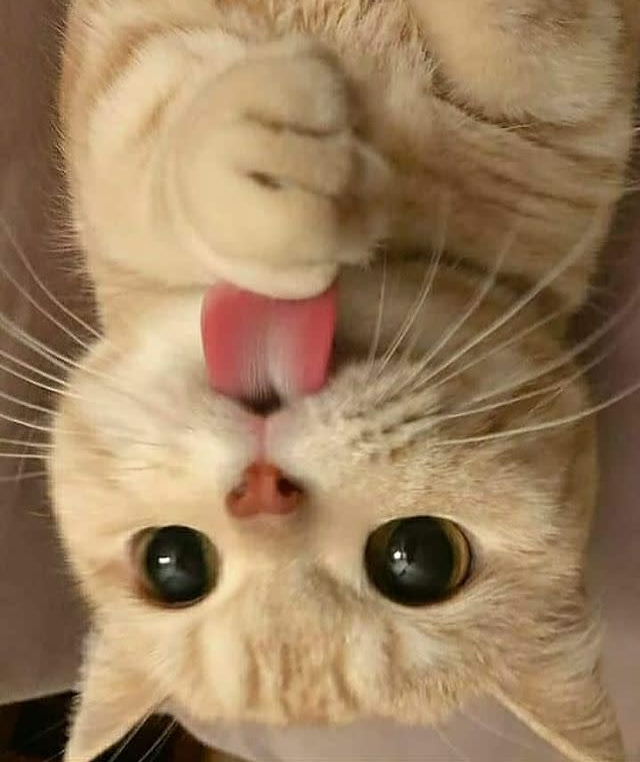

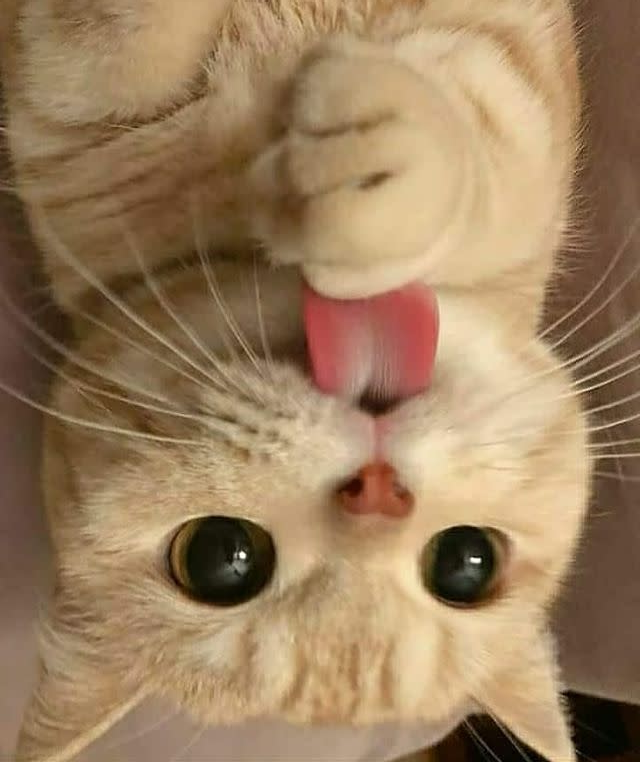

In [12]:
image=cv2.imread('/content/drive/MyDrive/Google Colab/Deep Learning/CNN/cat.jpg')

flip_h_image=cv2.flip(image,1)   #1 -> horizontal flip
flip_v_image=cv2.flip(image,0)   #0 -> vertical flip
flip_hv_image=cv2.flip(image,-1) #-1 -> both axes

cv2_imshow(image)
cv2_imshow(flip_h_image)
cv2_imshow(flip_v_image)
cv2_imshow(flip_hv_image)




---


**SHEARING**


---




[[0 0]
 [1 0]
 [1 1]
 [0 1]
 [0 0]]


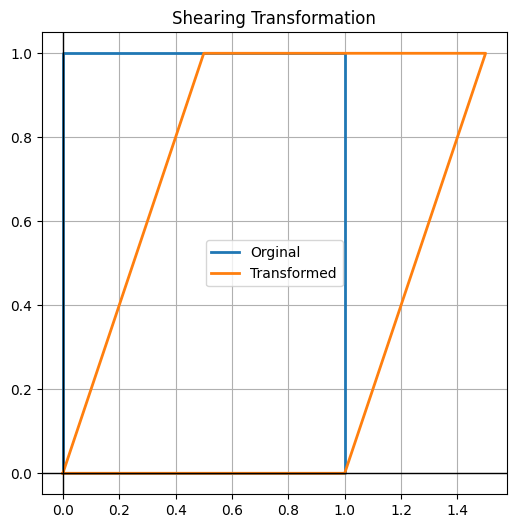

In [13]:
print(points)
shx,shy=0.5,0   #shear factors
Sh=np.array([[1,shx],[shy,1]])  #Shearing matrix

sheared=transform(points,Sh)
plot_transform(points,sheared,"Shearing Transformation")


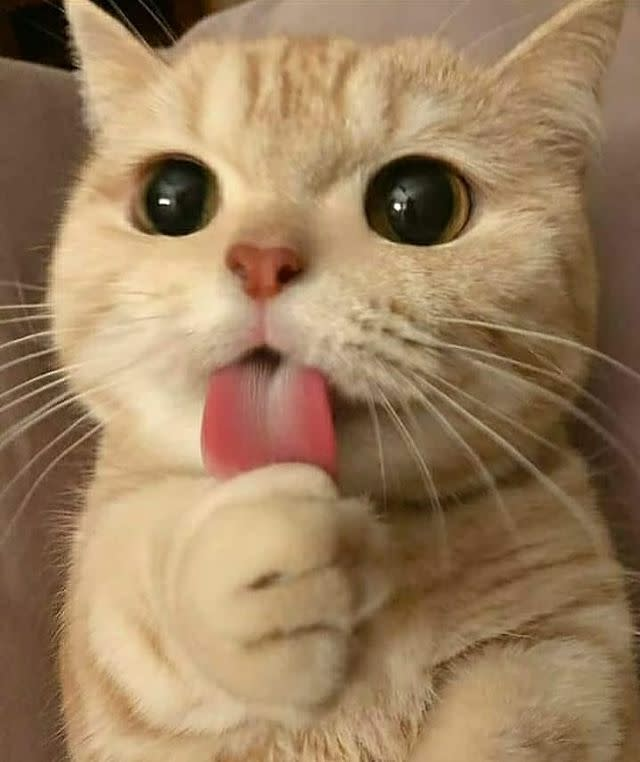

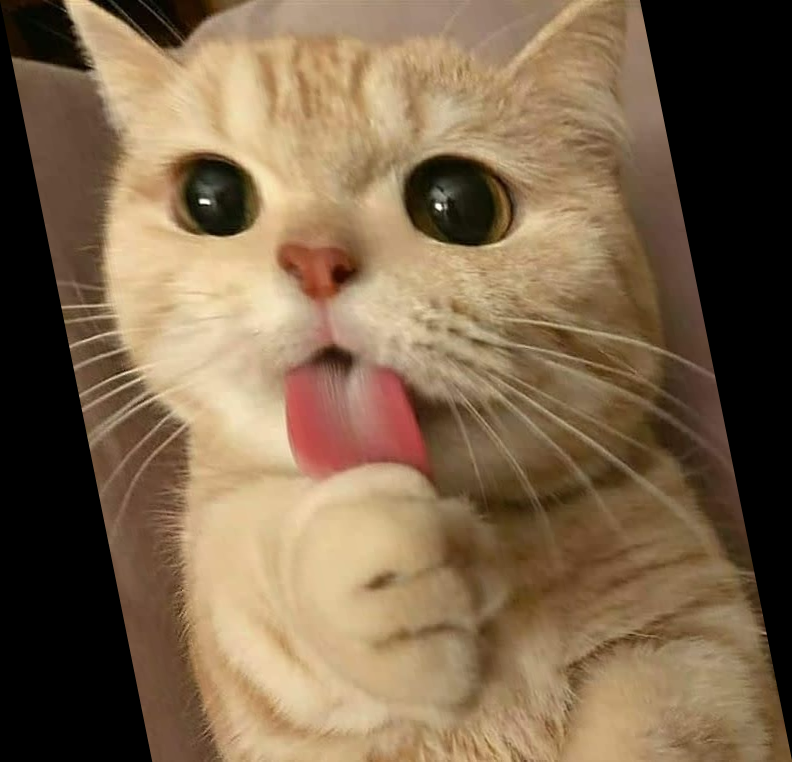

In [14]:
image=cv2.imread('/content/drive/MyDrive/Google Colab/Deep Learning/CNN/cat.jpg')
height,width=image.shape[:2]
shx=0.2   #shear factor along x
M=np.float32([[1,shx,0],[0,1,0]])
sheared_image=cv2.warpAffine(image,M,(int(width+shx*height),height))
cv2_imshow(image)
cv2_imshow(sheared_image)




---


**BRIGHTNESS AND CONTRAST**


---




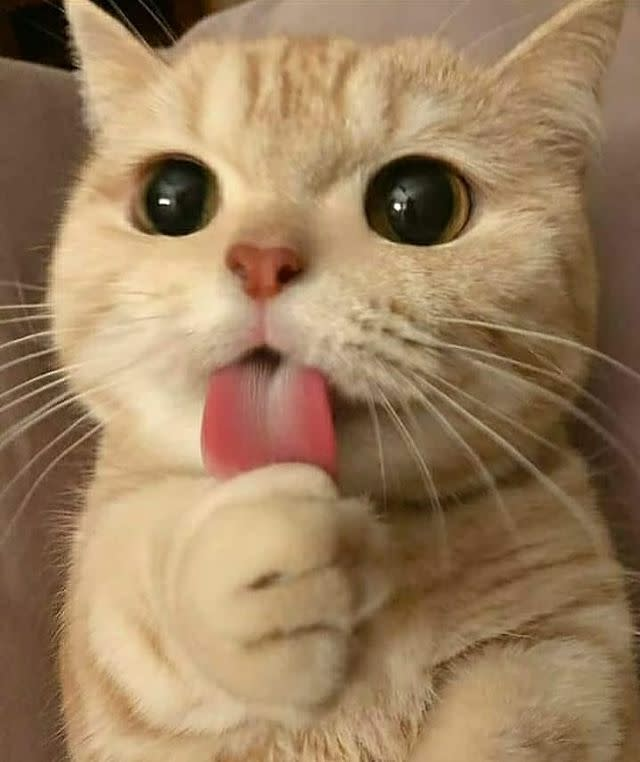

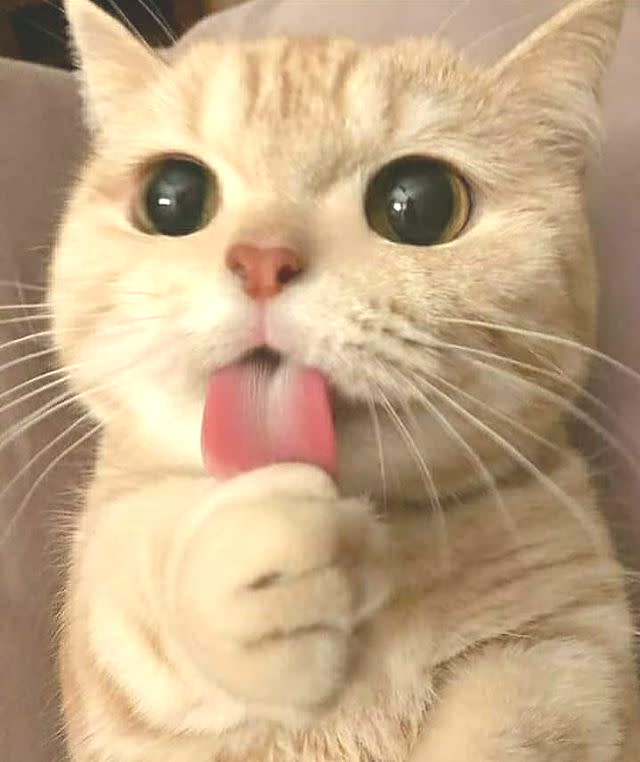

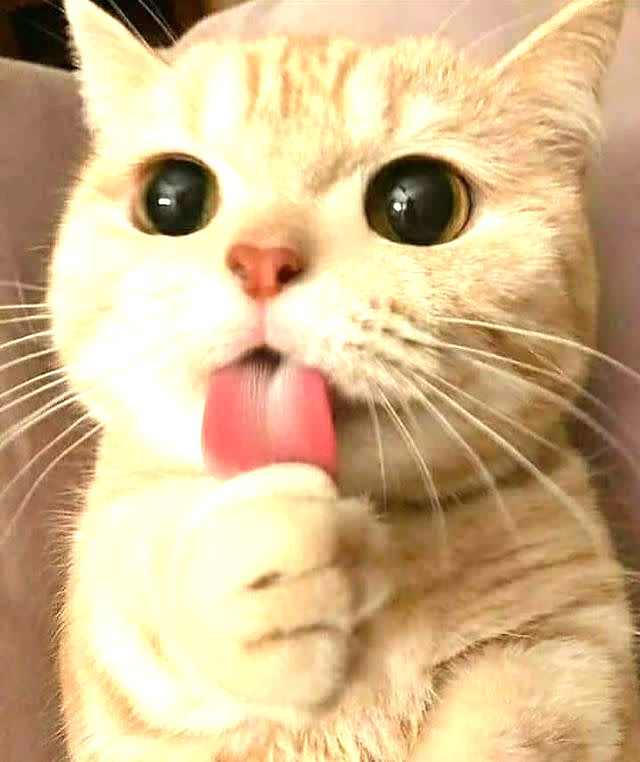

In [15]:
def adjust_brightness_contrast(image,brightness=30,contrast=1.2):
  """new_pixel = contrast * pixel + brightness"""
  adjusted=cv2.convertScaleAbs(image,alpha=contrast,beta=brightness)
  return adjusted

image=cv2.imread('/content/drive/MyDrive/Google Colab/Deep Learning/CNN/cat.jpg')
bright_image=adjust_brightness_contrast(image,brightness=40,contrast=1.0)
contrast_image=adjust_brightness_contrast(image,brightness=0,contrast=1.5)

cv2_imshow(image)
cv2_imshow(bright_image)
cv2_imshow(contrast_image)




---


**NOISE INJECTION**


---




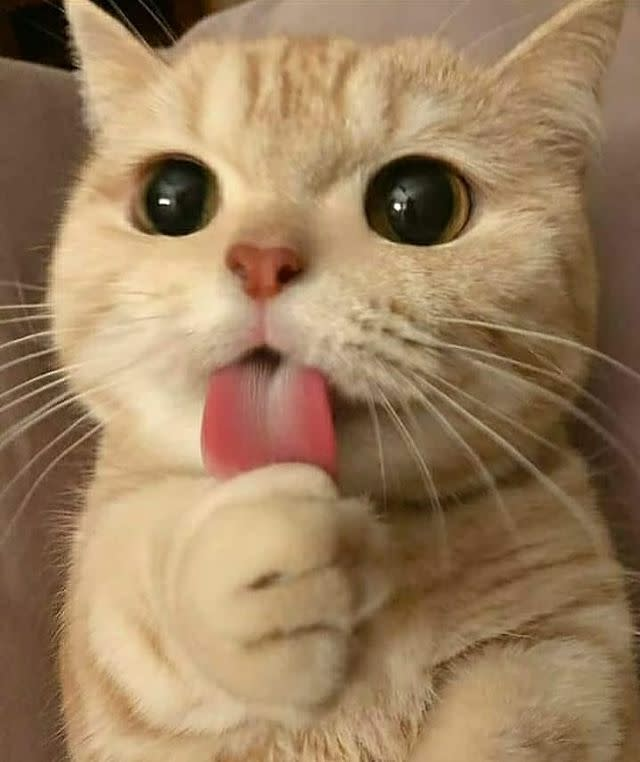

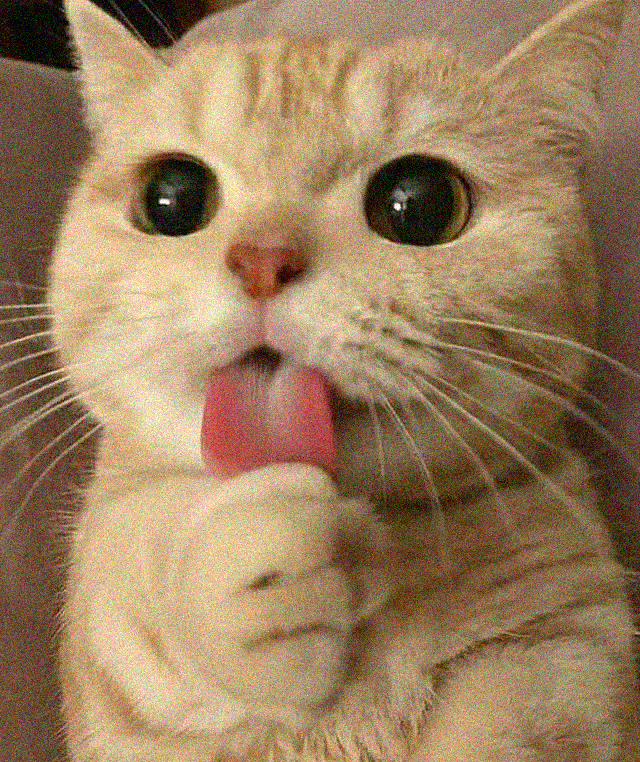

In [16]:
def add_gaussian_noise(image,mean=0,sigma=20):
  """Add Random Gaussian Noise"""
  noise=np.random.normal(mean,sigma,image.shape)
  noisy=image.astype(np.float32)+noise
  noisy=np.clip(noisy,0,255)
  return noisy.astype(np.uint8)

image=cv2.imread('/content/drive/MyDrive/Google Colab/Deep Learning/CNN/cat.jpg')
noisy_img=add_gaussian_noise(image)
cv2_imshow(image)
cv2_imshow(noisy_img)




---


**RANDOM CROP**


---




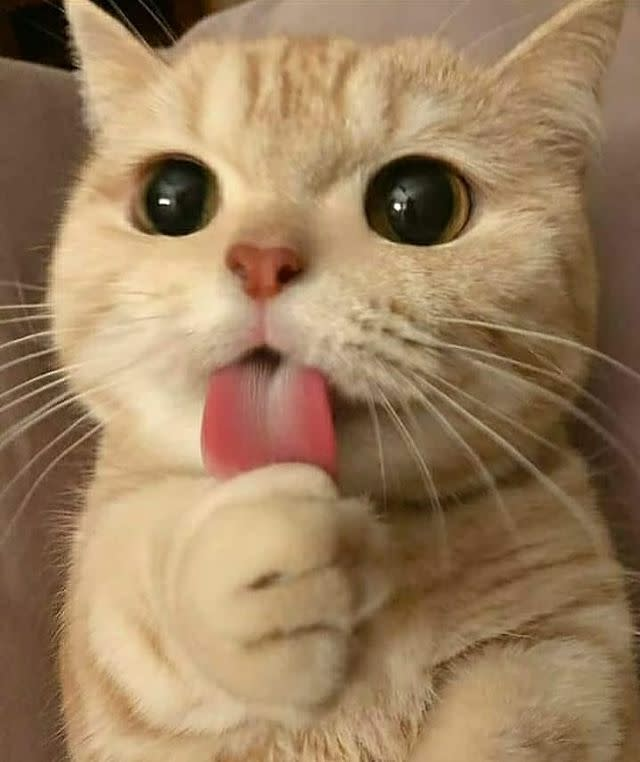

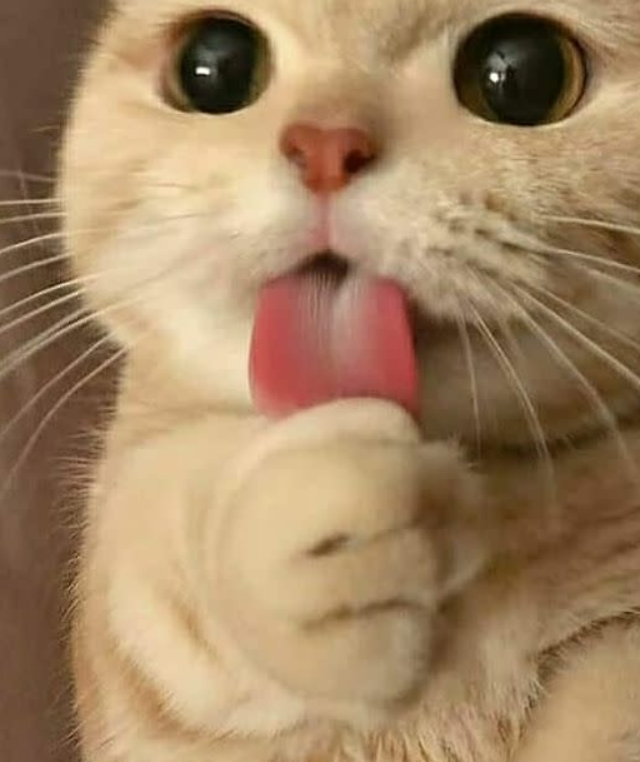

In [17]:
def random_crop(image,crop_ratio=0.8):
  """Randomly crop the image then resize back to original size"""
  height,width=image.shape[:2]
  crop_h,crop_w=int(height*crop_ratio),int(width*crop_ratio)

  y=random.randint(0,height-crop_h)
  x=random.randint(0,width-crop_w)

  cropped=image[y:y+crop_h,x:x+crop_w]
  return cv2.resize(cropped,(width,height))

image=cv2.imread('/content/drive/MyDrive/Google Colab/Deep Learning/CNN/cat.jpg')
cropped_img=random_crop(image)
cv2_imshow(image)
cv2_imshow(cropped_img)
